<a href="https://colab.research.google.com/github/TungSoPon/bsc_dpdm22/blob/main/Copy_of_Project_Datamining.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [67]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [68]:
import numpy as np 
import pandas as pd
import seaborn as sns

In [69]:
data_zoo = pd.read_csv('/content/drive/MyDrive/Project/zoo.csv')
data_zoo

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,breathes,venomous,fins,legs,tail,domestic,catsize,class_type
0,aardvark,1,0,0,1,0,0,1,1,1,1,0,0,4,0,0,1,1
1,antelope,1,0,0,1,0,0,0,1,1,1,0,0,4,1,0,1,1
2,bass,0,0,1,0,0,1,1,1,1,0,0,1,0,1,0,0,4
3,bear,1,0,0,1,0,0,1,1,1,1,0,0,4,0,0,1,1
4,boar,1,0,0,1,0,0,1,1,1,1,0,0,4,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,wallaby,1,0,0,1,0,0,0,1,1,1,0,0,2,1,0,1,1
97,wasp,1,0,1,0,1,0,0,0,0,1,1,0,6,0,0,0,6
98,wolf,1,0,0,1,0,0,1,1,1,1,0,0,4,1,0,1,1
99,worm,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,7


In [70]:
data_class = pd.read_csv('/content/drive/MyDrive/Project/class.csv')
data_class

,Class_Number,Number_Of_Animal_Species_In_Class,Class_Type,Animal_Names
0,1,41,Mammal,"aardvark, antelope, bear, boar, buffalo, calf,..."
1,2,20,Bird,"chicken, crow, dove, duck, flamingo, gull, haw..."
2,3,5,Reptile,"pitviper, seasnake, slowworm, tortoise, tuatara"
3,4,13,Fish,"bass, carp, catfish, chub, dogfish, haddock, h..."
4,5,4,Amphibian,"frog, frog, newt, toad"
5,6,8,Bug,"flea, gnat, honeybee, housefly, ladybird, moth..."
6,7,10,Invertebrate,"clam, crab, crayfish, lobster, octopus, scorpi..."


# แบ่งข้อมูล

In [71]:
from sklearn.model_selection import train_test_split
# Load the dataset
zoo_data = data_zoo

# Separate features and labels
X = zoo_data.drop(['animal_name', 'class_type'], axis=1)
y = zoo_data['class_type']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#  DecisionTree

In [72]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz
import graphviz

# Build the decision tree classifier
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make predictions on the testing set and calculate accuracy
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

# Export the decision tree as a dot file
export_graphviz(clf, out_file='tree.dot', feature_names=X.columns, class_names=['1', '2', '3', '4', '5', '6', '7'])

# Visualize the decision tree using graphviz
with open('tree.dot') as f:
    dot_graph = f.read()
graph = graphviz.Source(dot_graph)
graph.render('tree')


Accuracy: 0.9523809523809523


'tree.pdf'

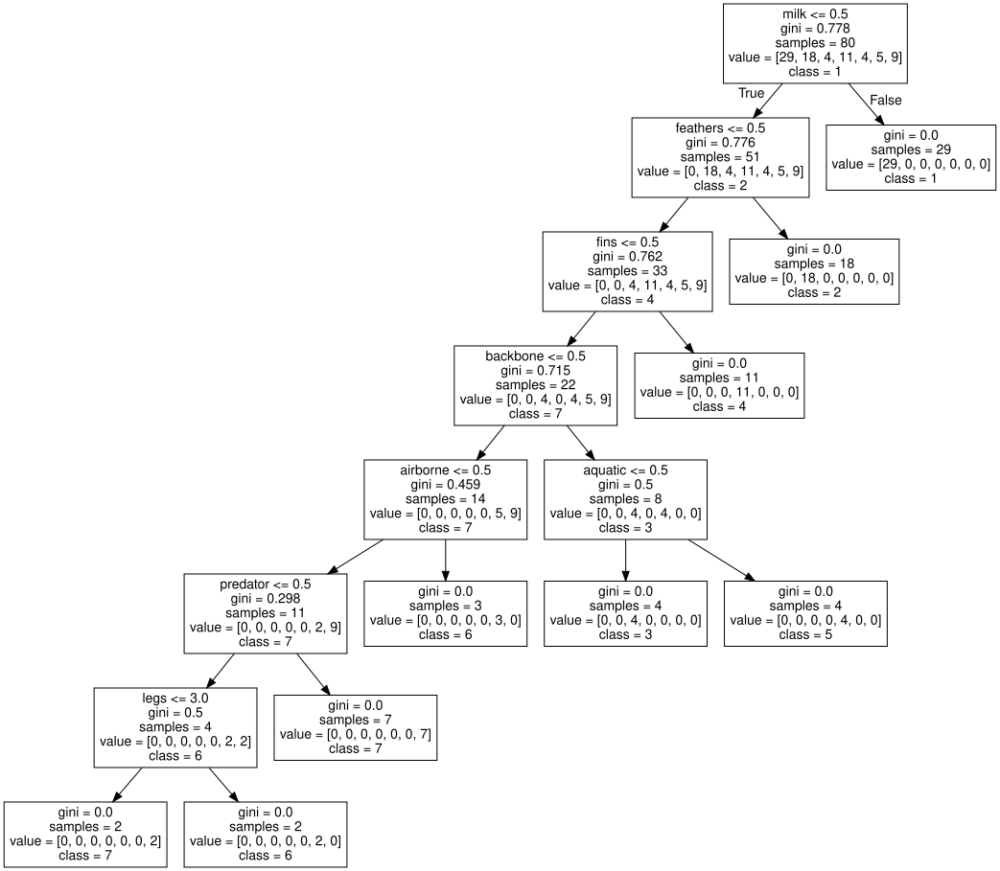

In [73]:
graph

Decision Tree คือวิธีการจัดการข้อมูลเชิงตัวเลขหรือแบบอนุพันธ์ โดยการแบ่งข้อมูลออกเป็นกลุ่มโดยใช้กฎเงื่อนไขหรือเหตุการณ์ที่เกิดขึ้นภายในข้อมูลเป็นแบบ Tree ที่แตกต่างกันไปตามความสำคัญของแต่ละกฎหรือเหตุการณ์ในการแบ่งข้อมูล

สำหรับชุดข้อมูล Zoo Animal Classification จะสามารถสร้าง Decision Tree เพื่อใช้ในการแบ่งข้อมูลและทำนายประเภทของสัตว์ได้ โดยมีขั้นตอนดังนี้

ตรวจสอบข้อมูลและสร้างตารางคำนวณเพื่อบันทึกค่า entropy และ information gain ของแต่ละคุณสมบัติ (feature) ที่ใช้ในการแบ่งข้อมูล โดย entropy จะบอกถึงความสับสนในข้อมูล และ information gain จะบอกถึงความสำคัญของ feature ในการแบ่งข้อมูล

เลือก feature ที่มี information gain สูงสุดเพื่อใช้ในการแบ่งข้อมูล และแบ่งข้อมูลออกเป็นกลุ่มโดยใช้ค่า threshold ของ feature นั้นๆ ในการแบ่ง

ทำซ้ำขั้นตอนที่ 1-2 บนแต่ละกลุ่มย่อย (subgroup) จนกว่าจะได้ Leaf node ซึ่งแทนประเภทของสัตว์

จัดเก็บ Decision Tree ที่ได้จากขั้นตอน 1-3 เพื่อนำไปใช้ในการทำนายประเภทของสัตว์จากข้อมูลใหม่

เมื่อได้ Decision Tree จากข้อมูล Zoo Animal Classification แล้ว สามารถนำไปใช้ในการทำนายประเภทของสัตว์จากข้อมูลใหม่ได้โดยการส่งค่าของคุ

# KNN

In [74]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [75]:
from sklearn.model_selection import cross_val_score
knn_distance = KNeighborsClassifier(n_neighbors=1, weights='distance')
scores = cross_val_score(knn_distance, X_train, y_train, cv=10)
print("Mean Cross-Validation Score: K1weighted", scores.mean())

# model 2 (K=3, weighted)
knn_distance = KNeighborsClassifier(n_neighbors=3, weights='distance')
scores = cross_val_score(knn_distance, X_train, y_train, cv=10)
print("Mean Cross-Validation Score: K3weighted", scores.mean())

# model 3 (K=5, weighted)
knn_distance = KNeighborsClassifier(n_neighbors=5, weights='distance')
scores = cross_val_score(knn_distance, X_train, y_train, cv=10)
print("Mean Cross-Validation Score: K5weighted", scores.mean())

# model 4 (K=1, no weighted)
knn_distance = KNeighborsClassifier(n_neighbors=1, weights='uniform')
scores = cross_val_score(knn_distance, X_train, y_train, cv=10)
print("Mean Cross-Validation Score: K1NOweighted", scores.mean())

# model 5 (K=3, no weighted)
knn_distance = KNeighborsClassifier(n_neighbors=3, weights='uniform')
scores = cross_val_score(knn_distance, X_train, y_train, cv=10)
print("Mean Cross-Validation Score: K3NOweighted", scores.mean())

# model 6 (K=5, no weighted)
knn_distance = KNeighborsClassifier(n_neighbors=5, weights='uniform')
scores = cross_val_score(knn_distance, X_train, y_train, cv=10)
print("Mean Cross-Validation Score: KNOweighted", scores.mean())

/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(


Mean Cross-Validation Score: K1weighted 0.975
Mean Cross-Validation Score: K3weighted 0.95
Mean Cross-Validation Score: K5weighted 0.9
Mean Cross-Validation Score: K1NOweighted 0.975
Mean Cross-Validation Score: K3NOweighted 0.925
Mean Cross-Validation Score: KNOweighted 0.8375


/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=10.
  warnings.warn(


In [76]:
knn_distance1 = KNeighborsClassifier(n_neighbors=5, weights='uniform')
knn_distance1.fit(X_train,y_train)

yknn_pred1 = knn_distance1.predict(X_test)

In [77]:
from sklearn.metrics import accuracy_score

# Assume y_true and y_pred are the true and predicted labels, respectively
accuracykkn1 = accuracy_score(y_test, yknn_pred1)

# Print the accuracy score
print("แสดงว่า Model KNN นี้มีแสดงประสิทธิภาพในการจำแนกประเภทของสัตว์เท่ากับ", accuracykkn1 )

แสดงว่า Model KNN นี้มีแสดงประสิทธิภาพในการจำแนกประเภทของสัตว์เท่ากับ 0.9047619047619048


# Naive_bayes

In [78]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the Naive Bayes classifier
nb = GaussianNB()

# Fit the model to the training data
nb.fit(X_train, y_train)

# Predict the class labels for the testing set
y_pred = nb.predict(X_test)

# Calculate the accuracy score of the model
accuracy = accuracy_score(y_test, y_pred)

# Print the accuracy score
print("Accuracy:", accuracy)

Accuracy: 0.9523809523809523


##สรุปจากการคำนวณความแม่นยำของโมเดล
1.  Model DecisionTree 
   * ได้ค่า Accuracy เท่ากับ 0.9523809523809523

2. KNeighbors
   * Model ที่ดีที่สุดคือ K=5, no weighted ซึ่งมีค่า Mean Cross-Validation Score เท่ากับ 0.975
   * ได้ค่า Accuracy เท่ากับ 0.9047619047619048

3. NaiveBayes
   * ได่ค่า Accuracy เท่ากับ 0.9523809523809523

#จึงสรุปว่า
สามารถเลือกใช้โมเดล  DecisionTree หรือ NaiveBayes ได้ทั้งสองโมเดลเนื่องจากมีค่า Accuracy เท่ากัน


# Association rules ของแต่ละลักษณะ โดยมีทั้งหมด 7 ลักษณะ

#เตรียมข้อมูลทำแต่ละประเภท

In [79]:
As = pd.merge(data_zoo, data_class, how='left', left_on='class_type', right_on='Class_Number')
As.head()

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,...,fins,legs,tail,domestic,catsize,class_type,Class_Number,Number_Of_Animal_Species_In_Class,Class_Type,Animal_Names
0,aardvark,1,0,0,1,0,0,1,1,1,...,0,4,0,0,1,1,1,41,Mammal,"aardvark, antelope, bear, boar, buffalo, calf,..."
1,antelope,1,0,0,1,0,0,0,1,1,...,0,4,1,0,1,1,1,41,Mammal,"aardvark, antelope, bear, boar, buffalo, calf,..."
2,bass,0,0,1,0,0,1,1,1,1,...,1,0,1,0,0,4,4,13,Fish,"bass, carp, catfish, chub, dogfish, haddock, h..."
3,bear,1,0,0,1,0,0,1,1,1,...,0,4,0,0,1,1,1,41,Mammal,"aardvark, antelope, bear, boar, buffalo, calf,..."
4,boar,1,0,0,1,0,0,1,1,1,...,0,4,1,0,1,1,1,41,Mammal,"aardvark, antelope, bear, boar, buffalo, calf,..."


In [80]:
dataas = As.drop(['Class_Number','Number_Of_Animal_Species_In_Class','class_type','Animal_Names'],axis=1)
dataas

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,breathes,venomous,fins,legs,tail,domestic,catsize,Class_Type
0,aardvark,1,0,0,1,0,0,1,1,1,1,0,0,4,0,0,1,Mammal
1,antelope,1,0,0,1,0,0,0,1,1,1,0,0,4,1,0,1,Mammal
2,bass,0,0,1,0,0,1,1,1,1,0,0,1,0,1,0,0,Fish
3,bear,1,0,0,1,0,0,1,1,1,1,0,0,4,0,0,1,Mammal
4,boar,1,0,0,1,0,0,1,1,1,1,0,0,4,1,0,1,Mammal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,wallaby,1,0,0,1,0,0,0,1,1,1,0,0,2,1,0,1,Mammal
97,wasp,1,0,1,0,1,0,0,0,0,1,1,0,6,0,0,0,Bug
98,wolf,1,0,0,1,0,0,1,1,1,1,0,0,4,1,0,1,Mammal
99,worm,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,Invertebrate


In [81]:
hair_map = {0: 'hairless', 1: 'hairy'}
feathers_map = {0: 'Nofeathers', 1: 'feathered'}
eggs_map = {0: 'Viviparous', 1: 'egg'}
milk_map = {0: 'not milk', 1: 'breastfeeding'}
airborne_map = {0: 'No fly', 1: 'can fly'}
aquatic_map = {0: 'No water', 1: 'in the water'}
predator_map = {0: 'No meat', 1: 'eat meat'}
toothed_map = {0: 'No toothed', 1: 'toothed'}
backbone_map = {0: 'No spine', 1: 'spine'}
breathes_map = {0: 'No breathes', 1: 'breathes'}
venomous_map = {0: 'Poisonous', 1: 'Poisonous'}
fins_map = {0: 'No fins', 1: 'have fins'}
legs_map = {0: '0legs', 2: '2legs', 4: '4legs', 5: '5legs', 6: '6legs'}
tail_map = {0: 'No tail', 1: 'with a tail'}
domestic_map = {0: 'No domestic', 1: 'have domestic'}
catsize_map = {0: 'No catsize', 1: 'catsize'}

In [82]:
dataas['hair'] = dataas['hair'].map(hair_map)
dataas['feathers'] = dataas['feathers'].map(feathers_map)
dataas['eggs'] = dataas['eggs'].map(eggs_map)
dataas['milk'] = dataas['milk'].map(milk_map)
dataas['airborne'] = dataas['airborne'].map(airborne_map)
dataas['aquatic'] = dataas['aquatic'].map(aquatic_map)
dataas['predator'] = dataas['predator'].map(predator_map)
dataas['toothed'] = dataas['toothed'].map(toothed_map)
dataas['backbone'] = dataas['backbone'].map(backbone_map)
dataas['breathes'] = dataas['breathes'].map(breathes_map)
dataas['venomous'] = dataas['venomous'].map(venomous_map)
dataas['fins'] = dataas['fins'].map(fins_map)
dataas['legs'] = dataas['legs'].map(legs_map)
dataas['tail'] = dataas['tail'].map(tail_map)
dataas['domestic'] = dataas['domestic'].map(domestic_map)
dataas['catsize'] = dataas['catsize'].map(catsize_map)

# 1.Association ของสัตว์ประเภท Mammal(เลี้ยงลูกด้วยนม)

In [83]:
!pip install apyori
import numpy as np
import matplotlib.pyplot as plt
from apyori import apriori

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [84]:
Class_Mammal = dataas[dataas['Class_Type']=='Mammal']
Class_Mammal.head()

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,breathes,venomous,fins,legs,tail,domestic,catsize,Class_Type
0,aardvark,hairy,Nofeathers,Viviparous,breastfeeding,No fly,No water,eat meat,toothed,spine,breathes,Poisonous,No fins,4legs,No tail,No domestic,catsize,Mammal
1,antelope,hairy,Nofeathers,Viviparous,breastfeeding,No fly,No water,No meat,toothed,spine,breathes,Poisonous,No fins,4legs,with a tail,No domestic,catsize,Mammal
3,bear,hairy,Nofeathers,Viviparous,breastfeeding,No fly,No water,eat meat,toothed,spine,breathes,Poisonous,No fins,4legs,No tail,No domestic,catsize,Mammal
4,boar,hairy,Nofeathers,Viviparous,breastfeeding,No fly,No water,eat meat,toothed,spine,breathes,Poisonous,No fins,4legs,with a tail,No domestic,catsize,Mammal
5,buffalo,hairy,Nofeathers,Viviparous,breastfeeding,No fly,No water,No meat,toothed,spine,breathes,Poisonous,No fins,4legs,with a tail,No domestic,catsize,Mammal


In [85]:
transacs_Class_Mammal = []
for i in range(0,len(Class_Mammal)):
  transacs_Class_Mammal.append([str(Class_Mammal.values[i,j]) for j in range(1,16)])
transacs_Class_Mammal

[['hairy',
  'Nofeathers',
  'Viviparous',
  'breastfeeding',
  'No fly',
  'No water',
  'eat meat',
  'toothed',
  'spine',
  'breathes',
  'Poisonous',
  'No fins',
  '4legs',
  'No tail',
  'No domestic'],
 ['hairy',
  'Nofeathers',
  'Viviparous',
  'breastfeeding',
  'No fly',
  'No water',
  'No meat',
  'toothed',
  'spine',
  'breathes',
  'Poisonous',
  'No fins',
  '4legs',
  'with a tail',
  'No domestic'],
 ['hairy',
  'Nofeathers',
  'Viviparous',
  'breastfeeding',
  'No fly',
  'No water',
  'eat meat',
  'toothed',
  'spine',
  'breathes',
  'Poisonous',
  'No fins',
  '4legs',
  'No tail',
  'No domestic'],
 ['hairy',
  'Nofeathers',
  'Viviparous',
  'breastfeeding',
  'No fly',
  'No water',
  'eat meat',
  'toothed',
  'spine',
  'breathes',
  'Poisonous',
  'No fins',
  '4legs',
  'with a tail',
  'No domestic'],
 ['hairy',
  'Nofeathers',
  'Viviparous',
  'breastfeeding',
  'No fly',
  'No water',
  'No meat',
  'toothed',
  'spine',
  'breathes',
  'Poisonous',

In [86]:
Asso_Class_Mammal = list(apriori(transacs_Class_Mammal,min_support = 0.98, min_confidence = 0.9))
Asso_Class_Mammal

[RelationRecord(items=frozenset({'Nofeathers'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'Nofeathers'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'Poisonous'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'Poisonous'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'breastfeeding'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'breastfeeding'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'breathes'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'breathes'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'spine'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'spine'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'Poisonous', 'Nofeathers'}), sup

In [87]:
#สร้างตัวแปรมาเก็บ 4-itemset
Asso_Class_Mammal4 =list()
for record in Asso_Class_Mammal:
    if len(record.items) == 4:
      Asso_Class_Mammal4.append(record)
Asso_Class_Mammal4

[RelationRecord(items=frozenset({'Poisonous', 'breathes', 'breastfeeding', 'Nofeathers'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'Poisonous', 'breathes', 'breastfeeding', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'Nofeathers'}), items_add=frozenset({'breathes', 'breastfeeding', 'Poisonous'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'Poisonous'}), items_add=frozenset({'breathes', 'breastfeeding', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'breastfeeding'}), items_add=frozenset({'breathes', 'Nofeathers', 'Poisonous'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'breathes'}), items_add=frozenset({'breastfeeding', 'Nofeathers', 'Poisonous'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'Poisonous', 'Nofeathers'}), items_add=frozenset({'breathes', 'breastfeeding'}), confidence=1.0, lift=

## สัตว์ประเภท Mammal (เลี้ยงลูกด้วยนม)

*   ถ้ามีกระดูกสันหลัง มีโอกาสที่จะมีฟัน และนม และมีหาง อยู่ 97.56%
*   ถ้ามีกระดูกสันหลังและมีนมด้วย มีโอกาสที่จะมีฟันและหาง อยู่ 97.56%
*   ถ้ามีกระดูกสันหลัง ฟัน และนม มีโอกาสที่จะมีหาง อยู่ 100%
*  lift เท่ากับ 1 คือ ลักษณะทั้งสองมีความสัมพันธ์กัน




# 2.Association ของสัตว์ประเภท Fish(ปลา)

In [88]:
Class_Fish = dataas[dataas['Class_Type']=='Fish']
Class_Fish.head()

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,breathes,venomous,fins,legs,tail,domestic,catsize,Class_Type
2,bass,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,toothed,spine,No breathes,Poisonous,have fins,0legs,with a tail,No domestic,No catsize,Fish
7,carp,hairless,Nofeathers,egg,not milk,No fly,in the water,No meat,toothed,spine,No breathes,Poisonous,have fins,0legs,with a tail,have domestic,No catsize,Fish
8,catfish,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,toothed,spine,No breathes,Poisonous,have fins,0legs,with a tail,No domestic,No catsize,Fish
12,chub,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,toothed,spine,No breathes,Poisonous,have fins,0legs,with a tail,No domestic,No catsize,Fish
18,dogfish,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,toothed,spine,No breathes,Poisonous,have fins,0legs,with a tail,No domestic,catsize,Fish


In [89]:
Transacs_Class_Fish = []
for i in range(0,len(Class_Fish)):
            Transacs_Class_Fish.append([str(Class_Fish.values[i,j]) for j in range(1,16)])
            Transacs_Class_Fish

In [90]:
Asso_Class_Fish = list(apriori(Transacs_Class_Fish,min_support = 0.95, min_confidence = 0.9))
Asso_Class_Fish

[RelationRecord(items=frozenset({'0legs'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'0legs'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No breathes'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No breathes'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No fly'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fly'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'Nofeathers'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'Nofeathers'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'Poisonous'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'Poisonous'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'egg'}), support=1.0, ordered_statistics

In [91]:
#สร้างตัวแปรมาเก็บ 4-itemset
Asso_Class_Fish4 =list()
for record in Asso_Class_Fish:
    if len(record.items) == 4:
      Asso_Class_Fish4.append(record)
Asso_Class_Fish4

[RelationRecord(items=frozenset({'No breathes', 'Nofeathers', 'No fly', '0legs'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No breathes', 'Nofeathers', 'No fly', '0legs'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'0legs'}), items_add=frozenset({'No breathes', 'No fly', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No breathes'}), items_add=frozenset({'No fly', '0legs', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No fly'}), items_add=frozenset({'No breathes', '0legs', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'Nofeathers'}), items_add=frozenset({'No breathes', 'No fly', '0legs'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No breathes', '0legs'}), items_add=frozenset({'No fly', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No fly', '

## สัตว์ประเภท Fish (ปลา)
* ถ้ามี ครีบ จะมีโอกาสที่จะไม่มีปีก อยู่ 100%
* ถ้าอาศัยอยู่ในน้ำ และมีครีบ จะมีโอกาสที่จะมีไข่ด้วย อยู่ 100%
* lift เท่ากับ 1 คือ ลักษณะทั้งสองมีความสัมพันธ์กัน


#3.Association ของสัตว์ประเภท Bird(นก)

In [92]:
Class_Bird = dataas[dataas['Class_Type']=='Bird']
Class_Bird.head()

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,breathes,venomous,fins,legs,tail,domestic,catsize,Class_Type
11,chicken,hairless,feathered,egg,not milk,can fly,No water,No meat,No toothed,spine,breathes,Poisonous,No fins,2legs,with a tail,have domestic,No catsize,Bird
16,crow,hairless,feathered,egg,not milk,can fly,No water,eat meat,No toothed,spine,breathes,Poisonous,No fins,2legs,with a tail,No domestic,No catsize,Bird
20,dove,hairless,feathered,egg,not milk,can fly,No water,No meat,No toothed,spine,breathes,Poisonous,No fins,2legs,with a tail,have domestic,No catsize,Bird
21,duck,hairless,feathered,egg,not milk,can fly,in the water,No meat,No toothed,spine,breathes,Poisonous,No fins,2legs,with a tail,No domestic,No catsize,Bird
23,flamingo,hairless,feathered,egg,not milk,can fly,No water,No meat,No toothed,spine,breathes,Poisonous,No fins,2legs,with a tail,No domestic,catsize,Bird


In [93]:
Transacs_Class_Bird = []
for i in range(0,len(Class_Bird)):
            Transacs_Class_Bird.append([str(Class_Bird.values[i,j]) for j in range(1,16)])
            Transacs_Class_Bird

In [94]:
Asso_Class_Bird = list(apriori(Transacs_Class_Bird,min_support = 0.95, min_confidence = 0.9))
Asso_Class_Bird

[RelationRecord(items=frozenset({'2legs'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'2legs'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No fins'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fins'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No toothed'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No toothed'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'Poisonous'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'Poisonous'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'breathes'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'breathes'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'egg'}), support=1.0, ordered_statistics=[Or

In [95]:
#สร้างตัวแปรมาเก็บ 4-itemset
Asso_Class_Bird4 =list()
for record in Asso_Class_Bird:
    if len(record.items) == 4:
      Asso_Class_Bird4.append(record)
Asso_Class_Bird4

[RelationRecord(items=frozenset({'No fins', 'Poisonous', 'No toothed', '2legs'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fins', 'Poisonous', 'No toothed', '2legs'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'2legs'}), items_add=frozenset({'No fins', 'No toothed', 'Poisonous'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No fins'}), items_add=frozenset({'No toothed', '2legs', 'Poisonous'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No toothed'}), items_add=frozenset({'No fins', '2legs', 'Poisonous'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'Poisonous'}), items_add=frozenset({'No fins', 'No toothed', '2legs'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No fins', '2legs'}), items_add=frozenset({'No toothed', 'Poisonous'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No toothed', '2le

## สัตว์ประเภท Bird (นก)
* ถ้ามี 2 ขา และมีขน จะมีโอกาสที่จะหายใจทางจมูก และไม่มีฟัน อยู่ 100%
* ถ้ามีไข่ แต่ไม่มีครีบและไม่มีนม มีโอกาสที่จะมีกระดูกสันหลัง และมีขน อยู่ 100%
* lift เท่ากับ 1 คือ ลักษณะทั้งสองมีความสัมพันธ์กัน

# 4.Association ของสัตว์ประเภท Reptile(สัตว์เลื้อยคลาน)

In [96]:
Class_Reptile = dataas[dataas['Class_Type']=='Reptile']
Class_Reptile.head()

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,breathes,venomous,fins,legs,tail,domestic,catsize,Class_Type
62,pitviper,hairless,Nofeathers,egg,not milk,No fly,No water,eat meat,toothed,spine,breathes,Poisonous,No fins,0legs,with a tail,No domestic,No catsize,Reptile
76,seasnake,hairless,Nofeathers,Viviparous,not milk,No fly,in the water,eat meat,toothed,spine,No breathes,Poisonous,No fins,0legs,with a tail,No domestic,No catsize,Reptile
80,slowworm,hairless,Nofeathers,egg,not milk,No fly,No water,eat meat,toothed,spine,breathes,Poisonous,No fins,0legs,with a tail,No domestic,No catsize,Reptile
90,tortoise,hairless,Nofeathers,egg,not milk,No fly,No water,No meat,No toothed,spine,breathes,Poisonous,No fins,4legs,with a tail,No domestic,catsize,Reptile
91,tuatara,hairless,Nofeathers,egg,not milk,No fly,No water,eat meat,toothed,spine,breathes,Poisonous,No fins,4legs,with a tail,No domestic,No catsize,Reptile


In [97]:
Transacs_Class_Reptile = []
for i in range(0,len(Class_Reptile)):
            Transacs_Class_Reptile.append([str(Class_Reptile.values[i,j]) for j in range(1,16)])
            Transacs_Class_Reptile

In [98]:
Asso_Class_Reptile = list(apriori(Transacs_Class_Reptile,min_support = 0.95, min_confidence = 0.9))
Asso_Class_Reptile

[RelationRecord(items=frozenset({'No domestic'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No domestic'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No fins'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fins'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No fly'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fly'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'Nofeathers'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'Nofeathers'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'Poisonous'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'Poisonous'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'hairless'}), support=1.0, ordered_s

In [99]:
#สร้างตัวแปรมาเก็บ 4-itemset
Asso_Class_Reptile4 =list()
for record in Asso_Class_Reptile:
    if len(record.items) == 4:
      Asso_Class_Reptile4.append(record)
Asso_Class_Reptile4

[RelationRecord(items=frozenset({'No fins', 'No domestic', 'No fly', 'Nofeathers'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fins', 'No domestic', 'No fly', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No domestic'}), items_add=frozenset({'No fins', 'No fly', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No fins'}), items_add=frozenset({'No domestic', 'No fly', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No fly'}), items_add=frozenset({'No fins', 'No domestic', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'Nofeathers'}), items_add=frozenset({'No fins', 'No domestic', 'No fly'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No fins', 'No domestic'}), items_add=frozenset({'No fly', 'Nofeathers'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozense

## สัตว์ประเภท Reptile (สัตว์เลื้อยคลาน)
* ถ้ามีหาง มีโอกาสจะไม่มีปีก อยู่ 100%
* ถ้าไม่มีนม ไม่มีปีก และไม่มีขน จะมีโอกาสที่จะมีกระดูกสันหลัง อยู่ 100%
* lift เท่ากับ 1 คือ ลักษณะทั้งสองมีความสัมพันธ์กัน

# 5.Association ของสัตว์ประเภท Amphibian(สัตว์สะเทินน้ำสะเทินบก)

In [100]:
Class_Amphibian = dataas[dataas['Class_Type']=='Amphibian']
Class_Amphibian.head()

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,breathes,venomous,fins,legs,tail,domestic,catsize,Class_Type
25,frog,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,toothed,spine,breathes,Poisonous,No fins,4legs,No tail,No domestic,No catsize,Amphibian
26,frog,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,toothed,spine,breathes,Poisonous,No fins,4legs,No tail,No domestic,No catsize,Amphibian
52,newt,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,toothed,spine,breathes,Poisonous,No fins,4legs,with a tail,No domestic,No catsize,Amphibian
89,toad,hairless,Nofeathers,egg,not milk,No fly,in the water,No meat,toothed,spine,breathes,Poisonous,No fins,4legs,No tail,No domestic,No catsize,Amphibian


In [101]:
Transacs_Class_Amphibian = []
for i in range(0,len(Class_Amphibian)):
            Transacs_Class_Amphibian.append([str(Class_Amphibian.values[i,j]) for j in range(1,16)])
            Transacs_Class_Amphibian

In [102]:
Asso_Class_Amphibian = list(apriori(Transacs_Class_Amphibian,min_support = 0.95, min_confidence = 0.9))
Asso_Class_Amphibian

[RelationRecord(items=frozenset({'4legs'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'4legs'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No domestic'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No domestic'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No fins'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fins'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No fly'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fly'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'Nofeathers'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'Nofeathers'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'Poisonous'}), support=1.0, ordered_statisti

In [103]:
#สร้างตัวแปรมาเก็บ 4-itemset
Asso_Class_Amphibian4 =list()
for record in Asso_Class_Amphibian:
    if len(record.items) == 4:
      Asso_Class_Amphibian4.append(record)
Asso_Class_Amphibian4

[RelationRecord(items=frozenset({'No fins', 'No domestic', 'No fly', '4legs'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fins', 'No domestic', 'No fly', '4legs'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'4legs'}), items_add=frozenset({'No fins', 'No domestic', 'No fly'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No domestic'}), items_add=frozenset({'No fins', 'No fly', '4legs'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No fins'}), items_add=frozenset({'No domestic', 'No fly', '4legs'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No fly'}), items_add=frozenset({'No fins', 'No domestic', '4legs'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No domestic', '4legs'}), items_add=frozenset({'No fins', 'No fly'}), confidence=1.0, lift=1.0), OrderedStatistic(items_base=frozenset({'No fins', '4legs'}), items_add=

## สัตว์ประเภท Amphibian(สัตว์สะเทินน้ำสะเทินบก)
* ถ้ามีหาง มีกระดูกสันหลัง มีโอกาสที่จะไม่มีปีก อยู่ 100%
* ถ้ามีฟัน มีหาง และอยู่ในน้ำ มีโอกาสที่จะไม่มีขน อยู่ 100%
* lift เท่ากับ 1 คือ ลักษณะทั้งสองมีความสัมพันธ์กัน

# 6.Association ของสัตว์ประเภท Bug(แมลง)

In [104]:
Class_Bug  = dataas[dataas['Class_Type']=='Bug']
Class_Bug .head()

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,breathes,venomous,fins,legs,tail,domestic,catsize,Class_Type
24,flea,hairless,Nofeathers,egg,not milk,No fly,No water,No meat,No toothed,No spine,breathes,Poisonous,No fins,6legs,No tail,No domestic,No catsize,Bug
30,gnat,hairless,Nofeathers,egg,not milk,can fly,No water,No meat,No toothed,No spine,breathes,Poisonous,No fins,6legs,No tail,No domestic,No catsize,Bug
39,honeybee,hairy,Nofeathers,egg,not milk,can fly,No water,No meat,No toothed,No spine,breathes,Poisonous,No fins,6legs,No tail,have domestic,No catsize,Bug
40,housefly,hairy,Nofeathers,egg,not milk,can fly,No water,No meat,No toothed,No spine,breathes,Poisonous,No fins,6legs,No tail,No domestic,No catsize,Bug
42,ladybird,hairless,Nofeathers,egg,not milk,can fly,No water,eat meat,No toothed,No spine,breathes,Poisonous,No fins,6legs,No tail,No domestic,No catsize,Bug


In [105]:
Transacs_Class_Bug = []
for i in range(0,len(Class_Bug)):
            Transacs_Class_Bug.append([str(Class_Bug.values[i,j]) for j in range(1,16)])
            Transacs_Class_Bug

In [106]:
Asso_Class_Bug = list(apriori(Transacs_Class_Bug,min_support = 0.95, min_confidence = 0.9))
Asso_Class_Bug

[RelationRecord(items=frozenset({'6legs'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'6legs'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No fins'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fins'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No spine'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No spine'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No tail'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No tail'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No toothed'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No toothed'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No water'}), support=1.0, ordered_statistics=[O

In [107]:
#สร้างตัวแปรมาเก็บ 4-itemset
Asso_Class_Bug4 =list()
for record in Asso_Class_Bug:
    if len(record.items) == 4:
      Asso_Class_Bug4.append(record)

## สัตว์ประเภท Bug(แมลง)
* ถ้ามีการหายใจทางจมูก มี 6 ขา มีไข่ จะไม่ใบหู อยู่ 100%
* ถ้ามีหาง ไม่มีนม มี 6 ขา มีโอกาสที่จะไม่มีครีบ อยู่ 100%
* lift เท่ากับ 1 คือ ลักษณะทั้งสองมีความสัมพันธ์กัน

# 7.Association ของสัตว์ประเภท Invertebrate(สัตว์ไม่มีกระดูกสันหลัง)

In [108]:
Class_Invertebrate  = dataas[dataas['Class_Type']=='Invertebrate']
Class_Invertebrate.head()

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,breathes,venomous,fins,legs,tail,domestic,catsize,Class_Type
13,clam,hairless,Nofeathers,egg,not milk,No fly,No water,eat meat,No toothed,No spine,No breathes,Poisonous,No fins,0legs,No tail,No domestic,No catsize,Invertebrate
14,crab,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,No toothed,No spine,No breathes,Poisonous,No fins,4legs,No tail,No domestic,No catsize,Invertebrate
15,crayfish,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,No toothed,No spine,No breathes,Poisonous,No fins,6legs,No tail,No domestic,No catsize,Invertebrate
46,lobster,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,No toothed,No spine,No breathes,Poisonous,No fins,6legs,No tail,No domestic,No catsize,Invertebrate
53,octopus,hairless,Nofeathers,egg,not milk,No fly,in the water,eat meat,No toothed,No spine,No breathes,Poisonous,No fins,NaN,No tail,No domestic,catsize,Invertebrate


In [109]:
Transacs_Class_Invertebrate = []
for i in range(0,len(Class_Invertebrate)):
            Transacs_Class_Invertebrate.append([str(Class_Invertebrate.values[i,j]) for j in range(1,16)])
            Transacs_Class_Invertebrate

In [110]:
Asso_Class_Invertebrate = list(apriori(Transacs_Class_Invertebrate,min_support = 0.95, min_confidence = 0.9))
Asso_Class_Invertebrate

[RelationRecord(items=frozenset({'No domestic'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No domestic'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No fins'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fins'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No fly'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No fly'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No spine'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No spine'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'No toothed'}), support=1.0, ordered_statistics=[OrderedStatistic(items_base=frozenset(), items_add=frozenset({'No toothed'}), confidence=1.0, lift=1.0)]),
 RelationRecord(items=frozenset({'Nofeathers'}), support=1.0, ordered_s

In [111]:
#สร้างตัวแปรมาเก็บ 4-itemset
Asso_Class_Invertebrate4 =list()
for record in Asso_Class_Invertebrate:
    if len(record.items) == 4:
      Asso_Class_Invertebrate4.append(record)

## สัตว์ประเภท Invertebrate(สัตว์ไม่มีกระดูกสันหลัง)
* ถ้าไม่มีนม ไม่มีครีบ ไม่มีปีก มีโอกาสที่จะไม่มีฟัน อยู่ 100%
* ถ้ามีหาง มีโอกาสที่จะไม่มีครีบ และกระดูกสันหลัง อยู่ 100%
* lift เท่ากับ 1 คือ ลักษณะทั้งสองมีความสัมพันธ์กัน

# K-means

In [137]:
data_zoo3 = pd.read_csv('/content/drive/MyDrive/Project/zoo.csv')
data_zoo3

,animal_name,hair,feathers,eggs,milk,airborne,aquatic,predator,toothed,backbone,breathes,venomous,fins,legs,tail,domestic,catsize,class_type
0,aardvark,1,0,0,1,0,0,1,1,1,1,0,0,4,0,0,1,1
1,antelope,1,0,0,1,0,0,0,1,1,1,0,0,4,1,0,1,1
2,bass,0,0,1,0,0,1,1,1,1,0,0,1,0,1,0,0,4
3,bear,1,0,0,1,0,0,1,1,1,1,0,0,4,0,0,1,1
4,boar,1,0,0,1,0,0,1,1,1,1,0,0,4,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,wallaby,1,0,0,1,0,0,0,1,1,1,0,0,2,1,0,1,1
97,wasp,1,0,1,0,1,0,0,0,0,1,1,0,6,0,0,0,6
98,wolf,1,0,0,1,0,0,1,1,1,1,0,0,4,1,0,1,1
99,worm,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,7


In [135]:
features = data_zoo3[['hair',	'feathers',	'eggs',	'milk',	'airborne',	'aquatic',	'predator',	'toothed','backbone',	'breathes',	'venomous',
                      'fins',	'legs',	'tail',	'domestic',	'catsize']]

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

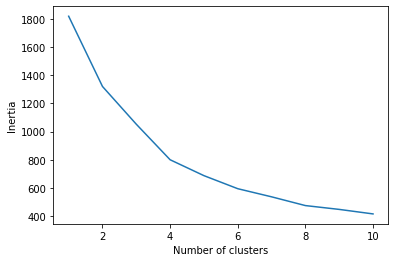

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


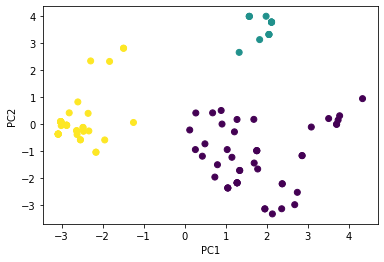

In [142]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Load the dataset
data = data_zoo3


# Remove the animal name column
X = data.drop('animal_name', axis=1)

# Scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA to reduce the dimensionality
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Determine the optimal number of clusters using the elbow method
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)
plt.plot(range(1, 11), inertia)
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

# Fit the k-means model with the optimal number of clusters
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_scaled)

# Add the predicted clusters to the original dataset
data['cluster'] = kmeans.labels_

# Visualize the clusters using the first two principal components
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans.labels_, cmap='viridis')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

In [136]:
kmeans = KMeans(n_clusters=3)

# Fit the model to your data
kmeans.fit(features)

# Predict the cluster labels for each data point
labels = kmeans.predict(features)

# Get the coordinates of the cluster centroids
centroids = kmeans.cluster_centers_

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<ipython-input-140-56edcd142897>:11: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(centroids[:, 0], centroids[:, 1],cmap='Paired', s=100, alpha=0.5)


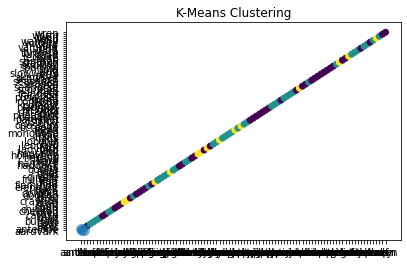

In [140]:
import matplotlib.pyplot as plt

# Extract two features to plot
x = data_zoo3['animal_name']
y = data_zoo3['animal_name']

# Create a scatter plot of the data, color-coded by cluster label
plt.scatter(x, y, c=labels, cmap='viridis')

# Add the centroids to the plot
plt.scatter(centroids[:, 0], centroids[:, 1],cmap='Paired', s=100, alpha=0.5)

# Set plot title and axis labels
plt.title('K-Means Clustering')

# Show the plot
plt.show()

In [114]:
data_zoo4 = data_zoo3[['hair',	'feathers'	,'eggs'	,'milk'	,'airborne'	,'aquatic'	,'predator',	'toothed',	'backbone',	'breathes',	
                       'venomous',	'fins',	'legs',	'tail',	'domestic',	'catsize',	'class_type','cluster']]

In [115]:
#Import required module
from sklearn.cluster import KMeans
 
#Initialize the class object
kmeans = KMeans(n_clusters= 10)
 
#predict the labels of clusters.
label = kmeans.fit_predict(data_zoo4)
 
print(label)

[2 2 3 2 2 2 2 3 3 2 2 1 3 5 6 6 1 2 3 7 1 1 2 1 0 8 8 4 2 4 0 2 4 1 3 2 2
 1 3 0 0 1 0 1 2 2 6 2 2 2 2 0 8 9 2 2 1 1 1 1 3 3 3 2 2 2 7 2 2 2 2 1 9 3
 7 7 3 5 1 1 3 5 3 1 4 6 3 1 0 8 1 1 3 4 2 1 4 0 2 5 1]


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [119]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


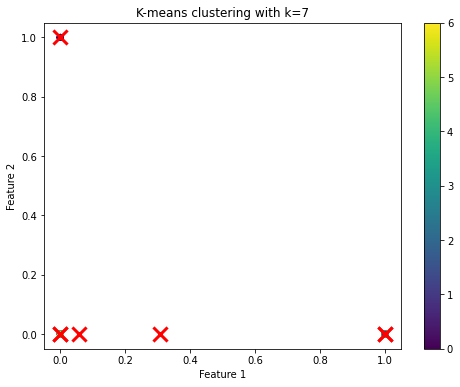

In [121]:
data = data_zoo

# Select the features to use for clustering
X = data.iloc[:, 1:17].values

# Perform K-means clustering with k=7
kmeans = KMeans(n_clusters=7)
kmeans.fit(X)

# Get the cluster labels and centroids
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Visualize the clusters
fig, ax = plt.subplots(figsize=(8, 6))
scatter = ax.scatter(X[:,0], X[:,1], c=labels, cmap='viridis')
ax.scatter(centroids[:,0], centroids[:,1], marker='x', s=200, linewidths=3, color='r')
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_title('K-means clustering with k=7')
plt.colorbar(scatter)
plt.show()

ในแบบจำลองการจัดกลุ่มค่า k-mean สำหรับข้อมูลการจำแนกสัตว์ในสวนสัตว์ สีของจุดในแผนภูมิกระจายแสดงถึงกลุ่มต่างๆ ที่จุดข้อมูลถูกกำหนดให้ สีของจุดบ่งชี้คลัสเตอร์ที่เป็นสมาชิก

เนื่องจากข้อมูลการจำแนกประเภทสัตว์ในสวนสัตว์มี 7 คลาสที่แตกต่างกัน (ประเภทสัตว์) จึงสามารถใช้โมเดลค่าเฉลี่ย k เพื่อจัดกลุ่มสัตว์ที่คล้ายคลึงกันตามคุณลักษณะของพวกมัน จำนวนกลุ่มที่เลือกสำหรับโมเดลค่าเฉลี่ย k จะกำหนดจำนวนสีที่ใช้ในแผนภาพกระจายเพื่อแสดงกลุ่มสัตว์ต่างๆ

ตัวอย่างเช่น หากเราเลือกสร้าง 3 คลัสเตอร์ แผนภาพกระจายจะมี 3 สีที่แตกต่างกัน หนึ่งสีสำหรับแต่ละคลัสเตอร์ เราสามารถตีความว่ากระจุกเป็นตัวแทนของกลุ่มสัตว์ที่มีลักษณะคล้ายกัน และสีของแต่ละจุดจะบ่งบอกว่าสัตว์นั้นอยู่ในกลุ่มใด จากนั้นเราสามารถวิเคราะห์ลักษณะของแต่ละกลุ่มเพื่อทำความเข้าใจลักษณะทั่วไปของสัตว์ในกลุ่มนั้น